In [1]:
import numpy as np
import torch
import torch.fft as fft
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from pathlib import Path
import mhnlib.utils as mhn_utils

In [2]:
def simulate_2d_phi4_model(
    gamma,
    r,
    g,
    T,
    dx,
    M,
    N,
    dt,
    num_iterations,
    device=None,
    dtype=torch.float32,
    verbose=False,
):
    """
    Simulates the 2D phi^4 Langevin dynamics

        d phi / dt = gamma Delta phi - r phi - g phi^3 + sqrt(2T) eta

    corresponding to the free energy

        F[phi] = integral [ gamma/2 |grad phi|^2 + r/2 phi^2 + g/4 phi^4 ]

    using an ETD1 semi-implicit spectral scheme.

    Args:
        gamma: stiffness
        r: quadratic coefficient, can be negative
        g: quartic coefficient, usually positive
        T: noise temperature
        dx: lattice spacing
        M: spatial grid size, M x M
        N: batch size / number of independent simulations
        dt: timestep
        num_iterations: number of timesteps

    Returns:
        phi_x: tensor of shape (N, M, M)
    """

    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    gamma = torch.as_tensor(gamma, device=device, dtype=dtype)
    r = torch.as_tensor(r, device=device, dtype=dtype)
    g = torch.as_tensor(g, device=device, dtype=dtype)
    T = torch.as_tensor(T, device=device, dtype=dtype)
    dt = torch.as_tensor(dt, device=device, dtype=dtype)
    dx = torch.as_tensor(dx, device=device, dtype=dtype)

    # Dimensionless lattice momenta theta_k = 2 pi k / M
    theta = 2.0 * torch.pi * fft.fftfreq(M, d=1.0, device=device, dtype=dtype)

    # Positive symbol of -Delta on the lattice
    lap_1d = (2.0 - 2.0 * torch.cos(theta)) / dx**2

    # Isotropic stiffness: gamma * (-Delta)
    lap_q = gamma * (lap_1d[:, None] + lap_1d[None, :])

    # Linear dynamics:
    # d phi_q / dt = -lambda_q phi_q - g FFT(phi^3)_q + noise
    lambda_q = lap_q + r

    exp_q = torch.exp(-lambda_q * dt)

    eps = torch.tensor(1e-12, device=device, dtype=dtype)

    etd_q = torch.where(
        lambda_q.abs() < eps,
        dt * torch.ones_like(lambda_q),
        -torch.expm1(-lambda_q * dt) / lambda_q,
    )

    noise_var_q = torch.where(
        lambda_q.abs() < eps,
        2.0 * T * dt * torch.ones_like(lambda_q),
        T * (-torch.expm1(-2.0 * lambda_q * dt)) / lambda_q,
    )/(dx**2)

    noise_std_q = torch.sqrt(torch.clamp(noise_var_q, min=0.0))

    phi_x = torch.randn(N, M, M, device=device, dtype=dtype)
    phi_q = fft.fft2(phi_x, dim=(-2, -1), norm="ortho")

    if verbose:
        pbar = tqdm(range(num_iterations), desc="Simulating", disable=not verbose)

    for _ in pbar:
        phi_x = fft.ifft2(phi_q, dim=(-2, -1), norm="ortho").real

        nonlinear_q = fft.fft2(-g * phi_x**3, dim=(-2, -1), norm="ortho")

        # Real-space Gaussian noise transformed with orthonormal FFT.
        # This preserves Hermitian symmetry and has normalized Fourier variance.
        xi_x = torch.randn_like(phi_x)
        xi_q = fft.fft2(xi_x, dim=(-2, -1), norm="ortho")

        phi_q = exp_q * phi_q + etd_q * nonlinear_q + noise_std_q * xi_q

    phi_x = fft.ifft2(phi_q, dim=(-2, -1), norm="ortho").real

    return phi_x.cpu()

### Generate Data

File paper_results/local_data/phi4_dx=0.50_M=256_g=1.00_r=-1.50_T=0.01.pt already exists, skipping simulation.
File paper_results/local_data/phi4_dx=0.50_M=256_g=1.00_r=-1.50_T=0.10.pt already exists, skipping simulation.
File paper_results/local_data/phi4_dx=0.50_M=256_g=1.00_r=-1.50_T=0.50.pt already exists, skipping simulation.
File paper_results/local_data/phi4_dx=0.50_M=256_g=1.00_r=-1.50_T=1.00.pt already exists, skipping simulation.


Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

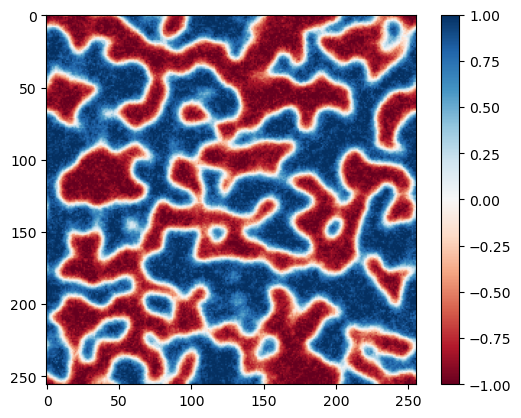

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

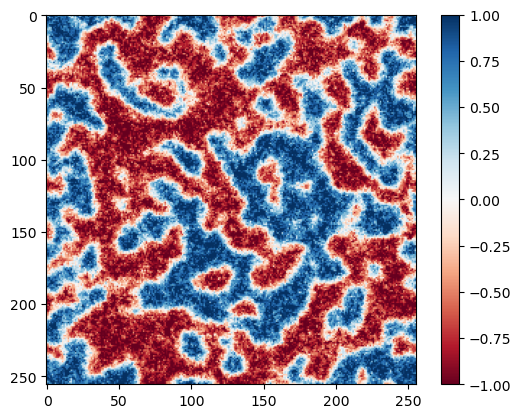

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

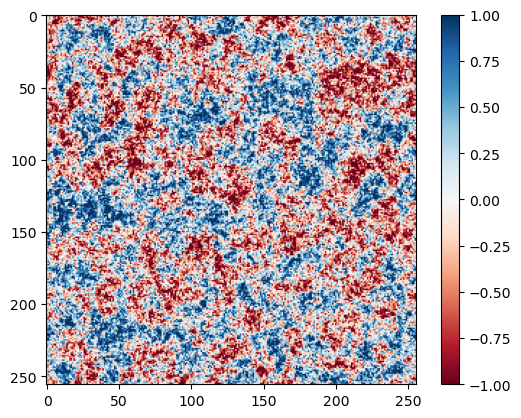

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

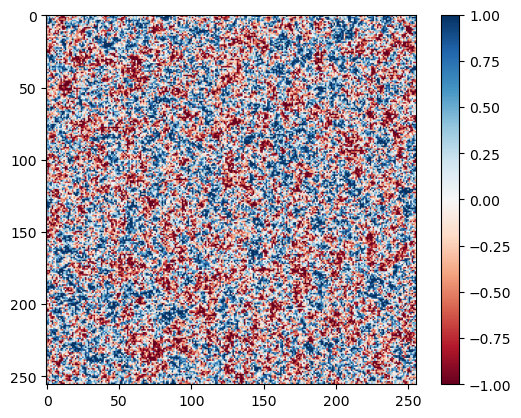

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

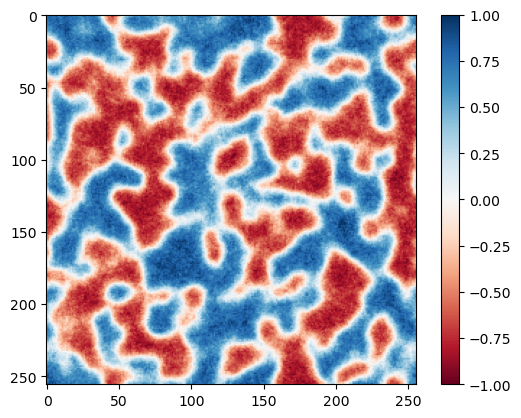

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

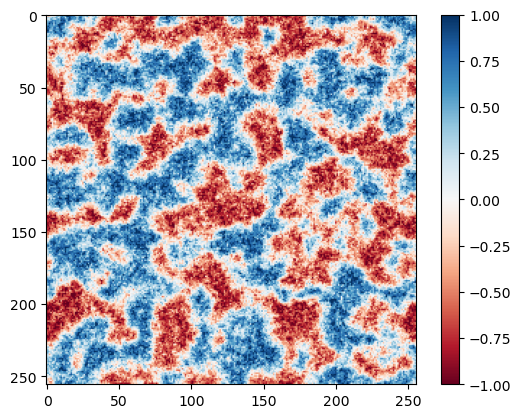

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

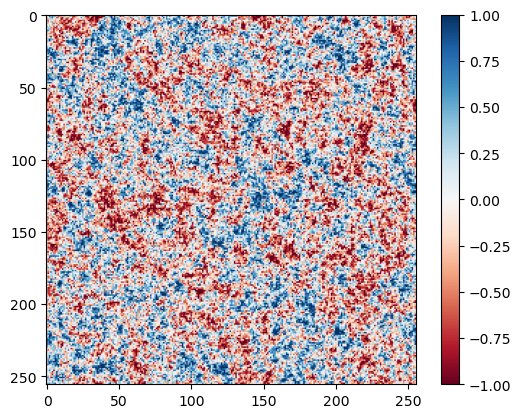

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

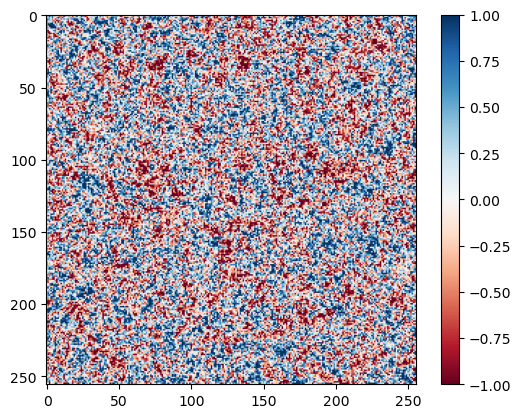

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

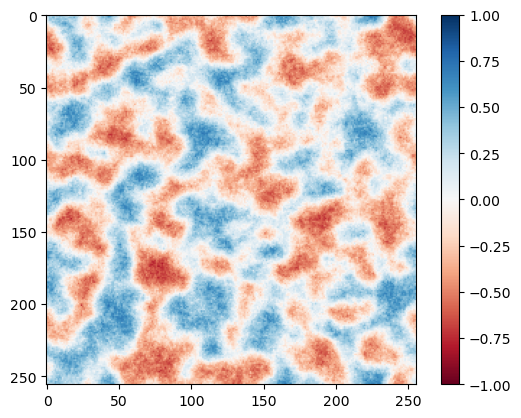

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

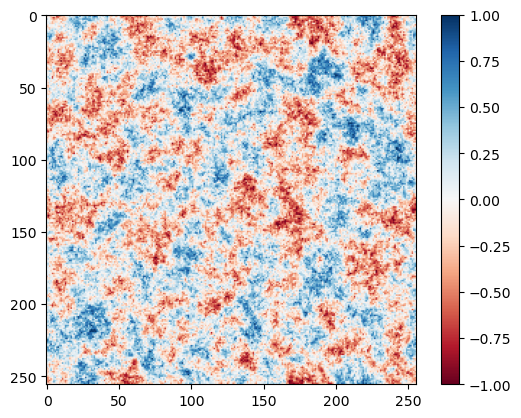

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

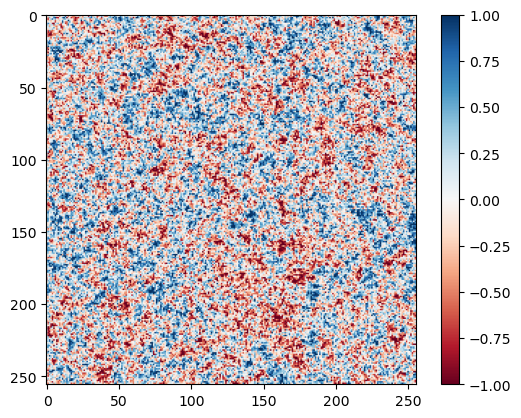

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

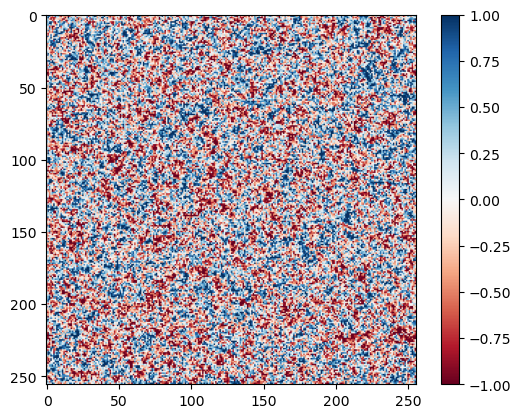

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

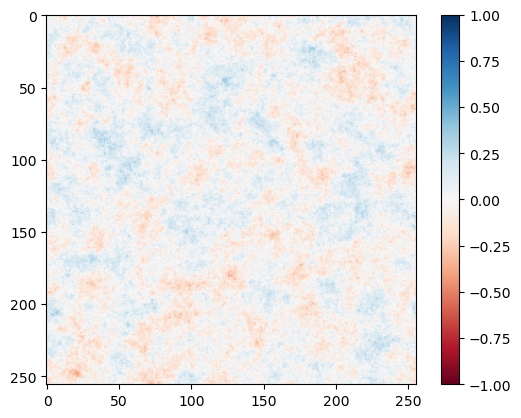

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

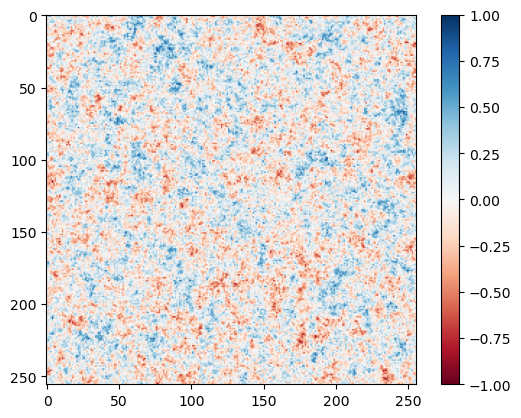

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

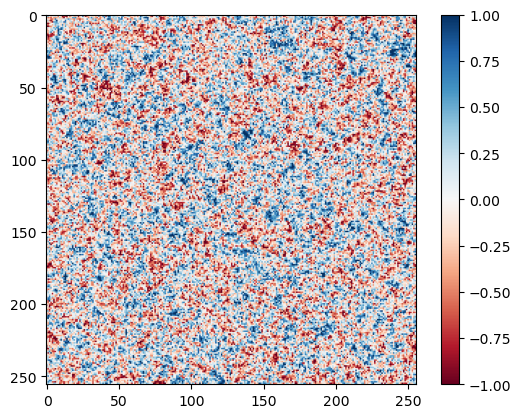

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

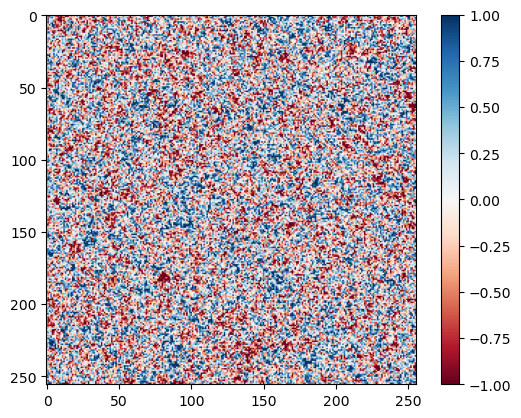

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

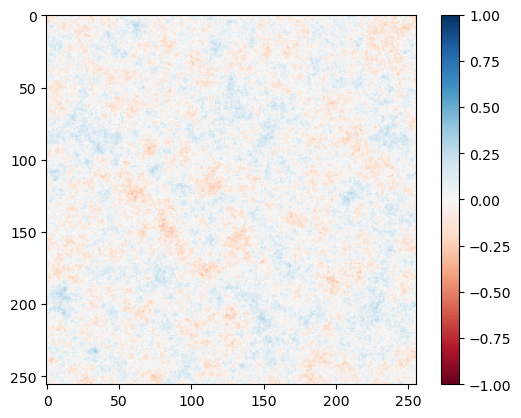

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

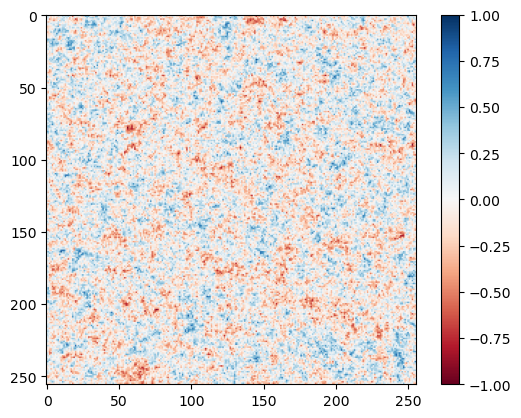

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

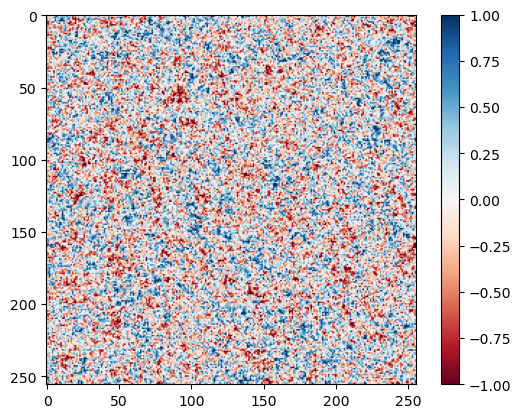

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

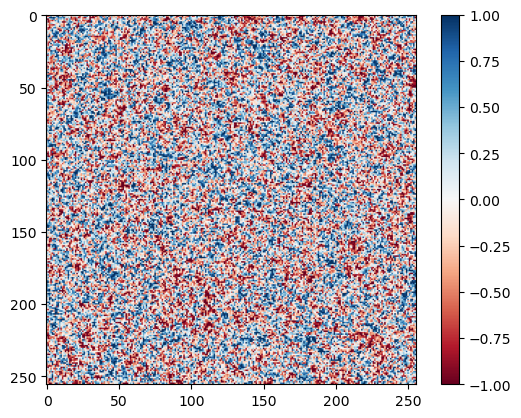

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

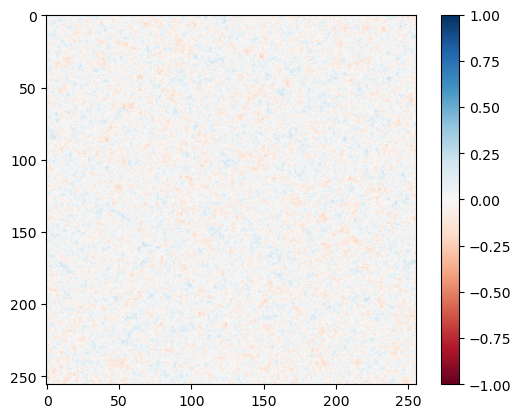

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

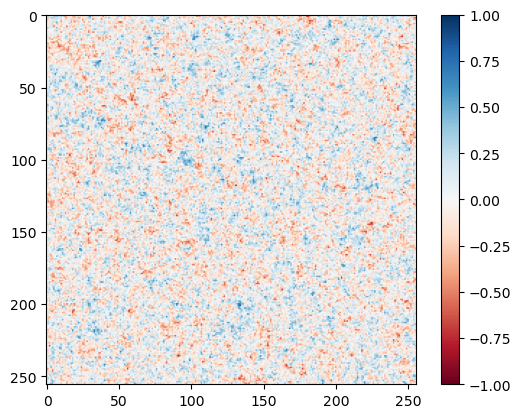

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

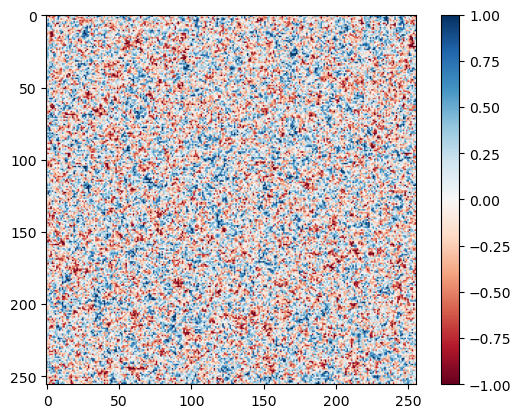

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

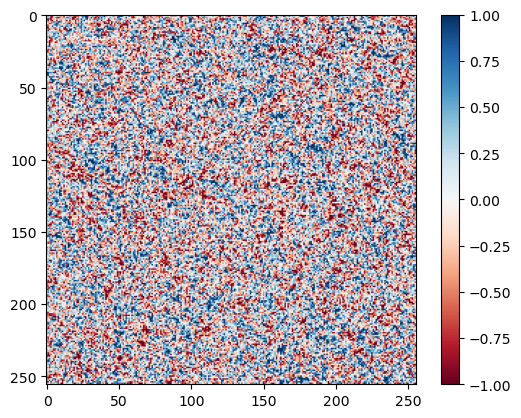

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

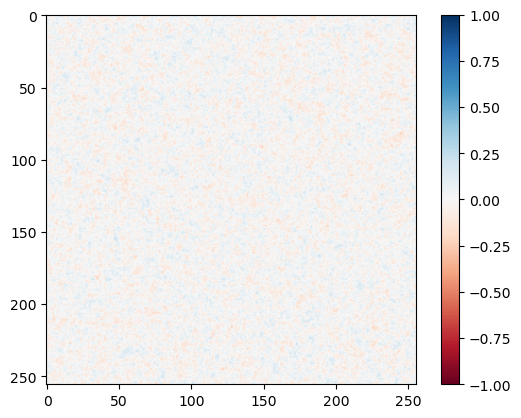

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

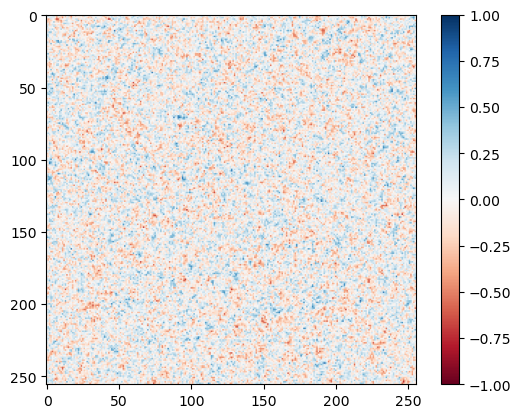

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

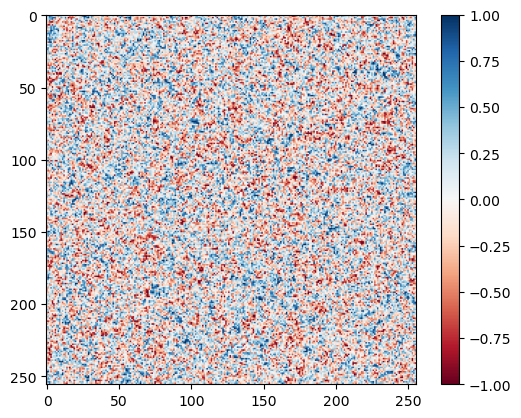

Simulating:   0%|          | 0/5000 [00:00<?, ?it/s]

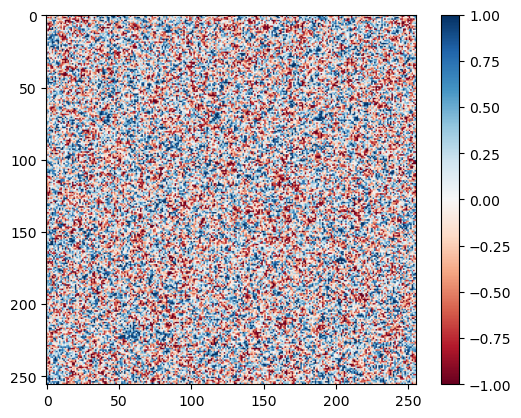

In [3]:
overwrite = False
gamma = 1.0
g = 1.0
dx = 0.5
M = 256
N = 1000
dt = 0.001
for r in [-1.5, -1.0, -0.75, -0.5, -0.1, 0.0, 0.5, 1.0]:
    for T in [0.01, 0.1, 0.5, 1.0]:
        filename = f'paper_results/local_data/phi4_dx={dx:.2f}_M={M}_g={g:.2f}_r={r:.2f}_T={T:.2f}.pt'
        if not overwrite and Path(filename).exists():
            print(f"File {filename} already exists, skipping simulation.")
            continue
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        phi = simulate_2d_phi4_model(gamma=gamma, r=r, g=g, dx=dx, M=M, N=N, dt=dt, T=T, num_iterations=5000, verbose=True)
        torch.save(phi, filename)
        plt.imshow(phi[0], vmin=-1, vmax=1, cmap='RdBu')
        plt.colorbar()
        plt.show()

### Locate data

In [4]:
root_folder = Path('paper_results/local_data/')
gamma = 1.0
g = 1.0
dx = 0.5
M = 256
N = 100
dt = 0.001
file_list = []
for file in root_folder.glob(f'phi4_dx={dx:.2f}_M={M}_g={g:.2f}_r=*_T=*.pt'):
    file_list.append(str(file.absolute()))

In [6]:
loaded_data = []
for file in tqdm(file_list):
    loaded_data.append(torch.as_tensor(torch.load(file, weights_only = False)))
loaded_data = torch.stack(loaded_data)

  0%|          | 0/32 [00:00<?, ?it/s]

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

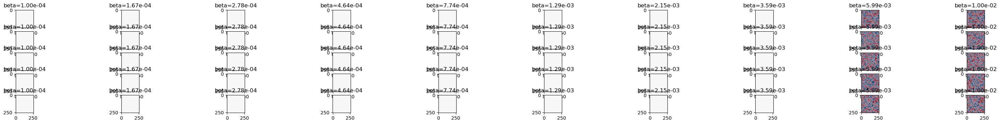

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

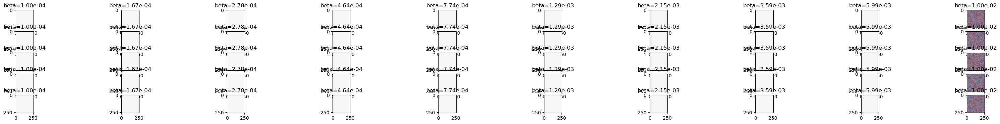

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

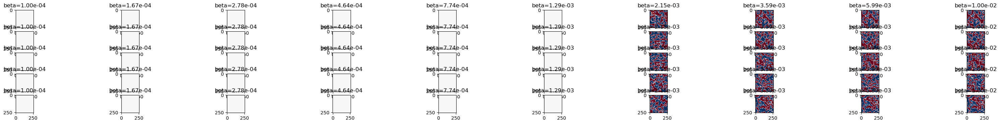

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

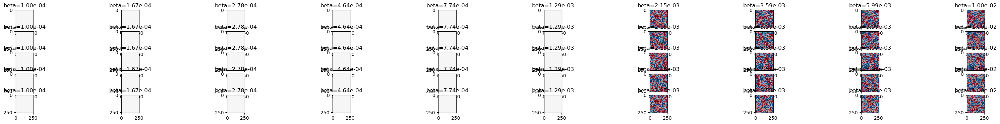

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

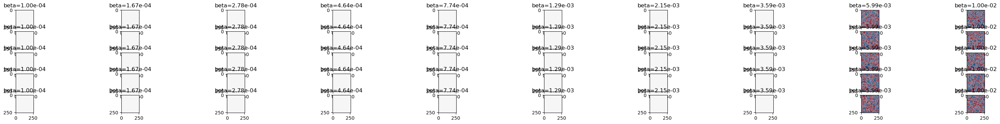

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

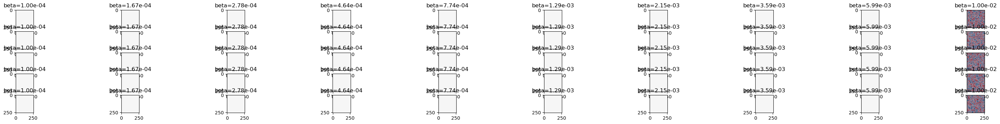

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

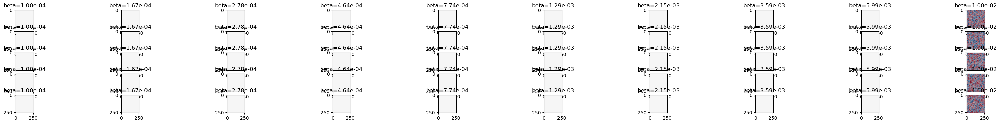

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

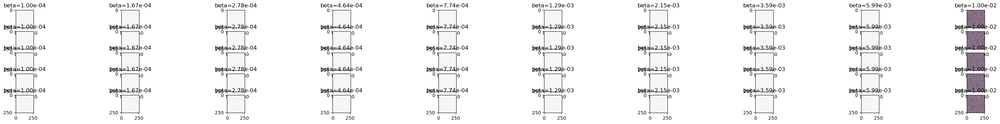

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

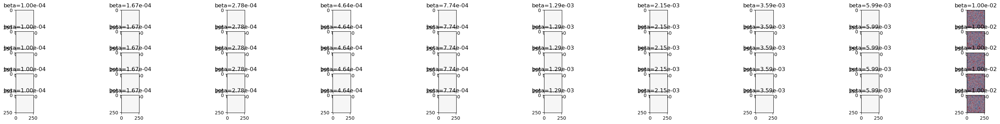

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

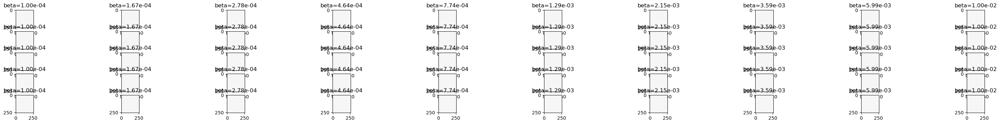

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

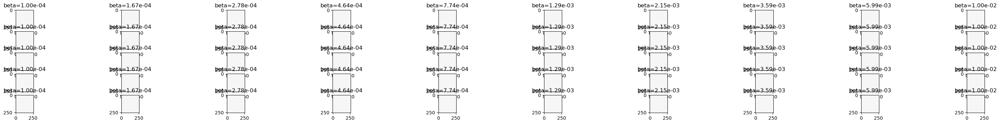

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

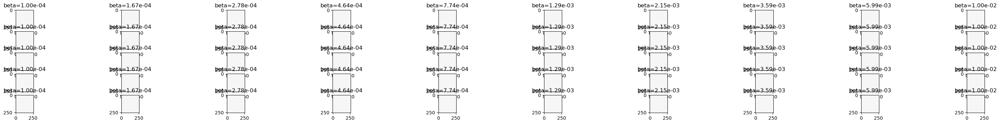

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

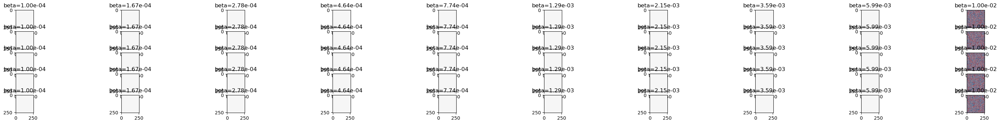

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

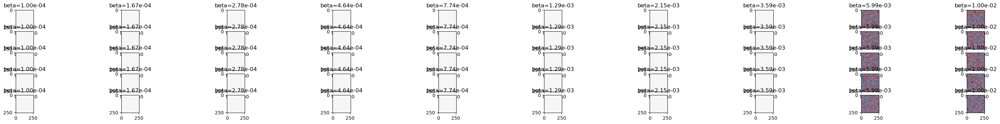

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

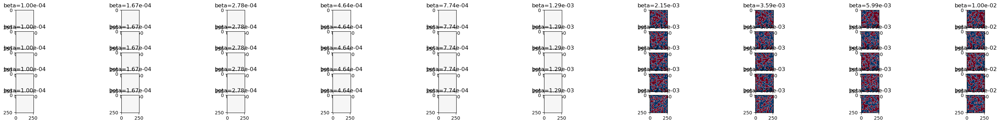

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

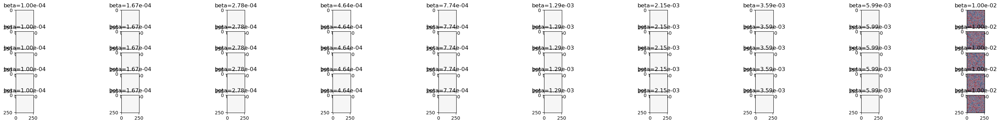

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

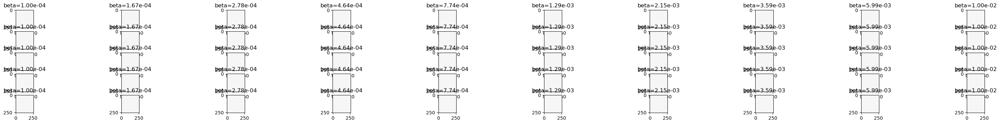

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

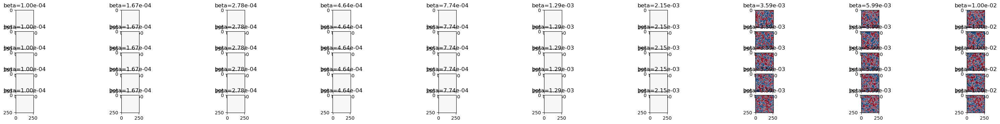

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

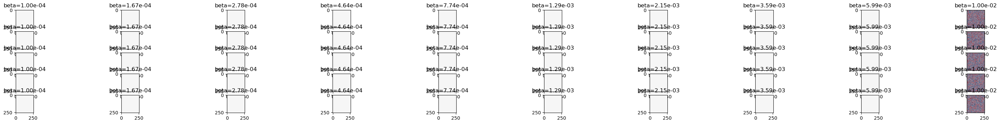

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

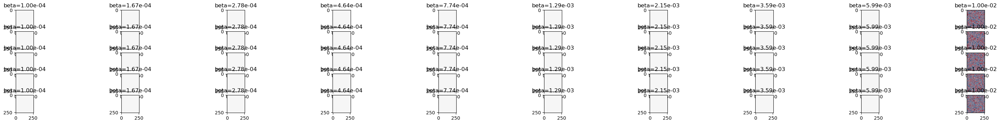

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

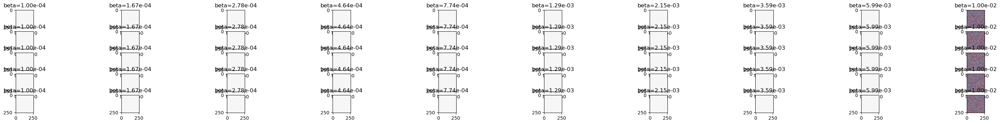

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

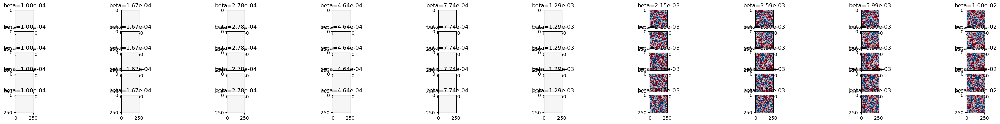

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

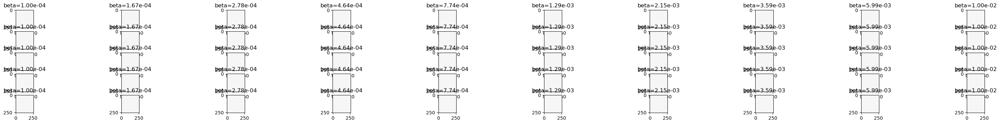

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

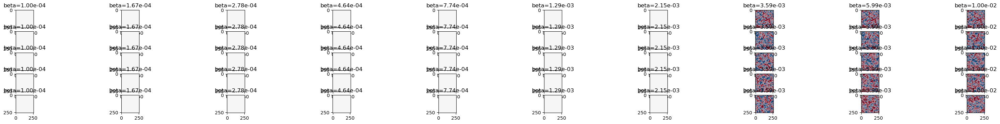

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

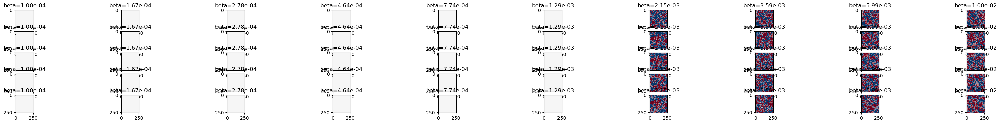

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

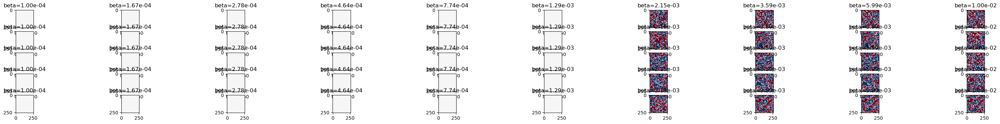

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

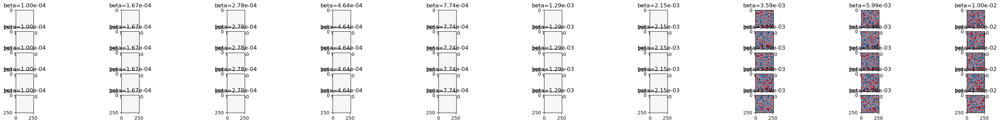

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

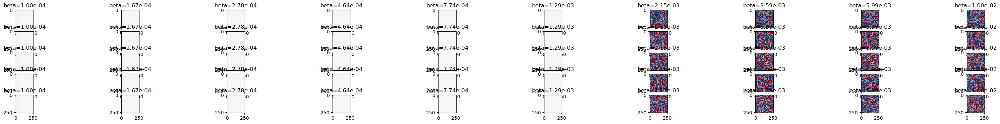

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

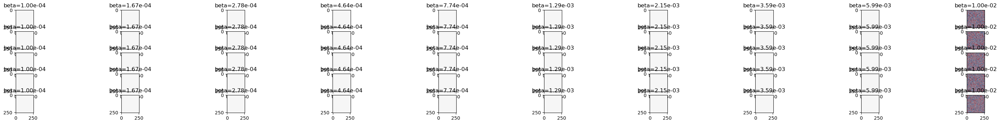

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

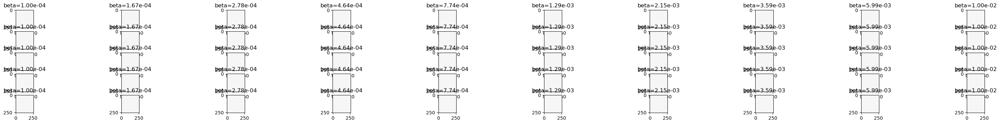

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

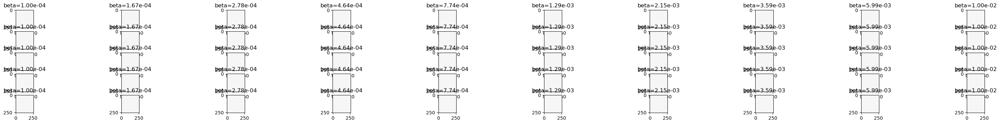

Computing fixed points:   0%|          | 0/1000 [00:00<?, ?it/s]

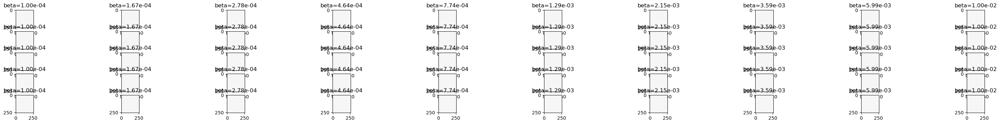

In [7]:
betas = torch.logspace(-4,-2,steps=10, device=loaded_data.device, dtype=loaded_data.dtype)
N_ic = 5
for data in loaded_data:
    patterns = data.view(data.shape[0], -1)
    patterns = patterns - patterns.mean(dim=0, keepdim=True)
    rms = patterns.norm(dim=1).mean()
    patterns = patterns / rms
    patterns_rms = patterns.var(dim=1).mean()
    patterns = patterns / patterns_rms.sqrt()
    ssm_unif = mhn_utils.get_symmetric_stability_matrix(patterns @ patterns.t(), w=torch.ones(patterns.shape[0], device=loaded_data.device, dtype=loaded_data.dtype)/patterns.shape[0])
    ssm_unif_eigvals = torch.linalg.eigvalsh(ssm_unif)
    phi_ic = torch.randn(N_ic,M*M, device=loaded_data.device, dtype=loaded_data.dtype)*(patterns_rms.sqrt())
    phi_memories, prob_memories = mhn_utils.deterministic_dynamics(patterns,
                                                     torch.zeros(patterns.shape[0], 
                                                                 device=loaded_data.device, 
                                                                 dtype=loaded_data.dtype), 
                                                    betas = betas,
                                                    x0 = phi_ic, num_iterations=1000, return_probs=True, verbose=True)
    phi_memories = phi_memories.squeeze()
    prob_memories = prob_memories.squeeze()
    
    entropy_memories = mhn_utils.get_entropy(prob_memories).mean(dim=1)
    fig, axs = plt.subplots(nrows=N_ic, ncols=len(betas), figsize=(4*len(betas),4))
    for i in range(N_ic):
        for j, beta in enumerate(betas):
            axs[i, j].imshow(phi_memories[j,i].view(M, M).cpu(), vmin=-1.0, vmax=1.0, cmap='RdBu')
            axs[i, j].set_title(f'beta={beta:.2e}')
    plt.show()